<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import requests 
from urllib.parse import urlencode 


In [2]:
# функция считывания DataFrame с Yandex-диска
def url_disk(public):
    base = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
    last = base + urlencode(dict(public_key=public)) 
    return requests.get(last).json() ['href']

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [3]:
# чтение hh.csv (zip) c Yandex-диска
url = 'https://disk.yandex.ru/d/LfD9BwlZCMMpWg'
hh_df = pd.read_csv(url_disk(url), compression='zip') 
hh_df.shape

(44744, 12)

2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [4]:
display(hh_df.head(2))
display(hh_df.tail(2))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

In [5]:
hh_df.info()
print(f"\nДатасет имеет {hh_df.shape[0]} строк и {hh_df.shape[1]} столбцов")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

4. Обратите внимание на информацию о числе непустых значений.

In [6]:
all_skip = hh_df.isnull().sum().sum()
print("Всего пропусков:", all_skip)
skip_in_cols = hh_df.isna().sum().to_frame(name="nans").query("nans>0")["nans"]
print(f"Из них:\n{skip_in_cols.to_string()}")

Всего пропусков: 171
Из них:
Опыт работы                        168
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2


5. Выведите основную статистическую информацию о столбцах.


In [7]:
hh_df.describe(include='all')

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [8]:
x = hh_df['Образование и ВУЗ']
hh_df['Образование'] = x.apply(lambda x: x.split()[0] if x.split()[1] \
    in 'образование' else x.split()[0]+' '+x.split()[1])
midl = hh_df[hh_df['Образование']=='Среднее']
print(f"Средний уровень образования (школьное) имеют {midl.shape[0]} соискателей")
hh_df.drop(columns=['Образование и ВУЗ'], inplace=True)

Средний уровень образования (школьное) имеют 559 соискателей


2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [9]:
def transform(x):
    hh_df['Пол'] = x.apply(lambda x: 'М' if x.split()[0] in 'Мужчина' else 'Ж')
    hh_df['Возраст'] = x.apply(lambda x: int(x.split()[2]))
    return hh_df

display(transform(hh_df['Пол, возраст']).head(2))

hh_df.drop(columns='Пол, возраст', inplace=True)
df_f = hh_df[hh_df['Пол']=='Ж'].shape[0]*100
print("Женских резюме (%):", round(df_f/hh_df.shape[0], 2))
print("Средний возраст соискателей:", hh_df['Возраст'].mean().round(2))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,16.04.2019 15:59,Имеется собственный автомобиль,Неоконченное высшее,М,39
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",12.04.2019 08:42,Не указано,Высшее,М,60


Женских резюме (%): 19.07
Средний возраст соискателей: 32.2


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [10]:
x = hh_df['Опыт работы']

# возврат True, если x[n] ─ число в тексте
def dec(x, n):
    return x.split()[n].isdecimal()

# возврат True, если x не NaN и не строка "Не"
def cond(x):
    return x is not np.nan and x.split()[0] != 'Не'

hh_df['Опыт работы (месяц)'] = x.apply(lambda x: 
    # поиск лет и месяцев, перевод в месяцы, запись результата
    int(x.split()[2])*12+int(x.split()[4]) if cond(x) \
        and dec(x, 2) and dec(x, 4) else
    # поиск лет, перевод в месяцы, запись результата
    int(x.split()[2])*12 if cond(x) and dec(x, 2) \
        and x.split()[3][0].lower() != 'м' else 
    # поиск месяцев, запись результата
    int(x.split()[2]) if cond(x) and dec(x, 2) \
        and x.split()[3][0].lower() == 'м' else
    # поиск NaN и 'Не указано', перевод в NaN, запись результата
    np.nan if not cond(x) else x)

hh_df.drop(columns='Опыт работы', inplace=True)
med = int(hh_df['Опыт работы (месяц)'].median())
print("Медианный опыт работы (в месяцах):", med)

Медианный опыт работы (в месяцах): 100


4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [11]:
million_cities = ['Новосибирск', 'Екатеринбург', 'Нижний Новгород', 'Казань', 
    'Челябинск', 'Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 
    'Пермь', 'Воронеж', 'Волгоград']
cap = ['Москва', 'Санкт-Петербург']
x = hh_df['Город, переезд, командировки']

def mov(x):
    if ('не готов к переезду' in x) or ('не готова к переезду' in x):
        return False
    else:
        return True

def mission(x):
    if ('командировка' in x):
        if ('не готов к командировкам' in x) or ('не готова к командировкам' in x):
            return False
        else:
            return True
    else:
        return False
hh_df['Город'] = x.apply(lambda x: 
    'город-миллионник' if x.split()[0] in million_cities else 
    x.split()[0] if x.split()[0] in cap else 'другие')
hh_df['Готовность к переезду'] = x.apply(lambda x: 
    True if mov(x) else False)
hh_df['Готовность к командировкам'] = x.apply(lambda x: 
    True if mission(x) else False)
hh_df.drop(columns='Город, переезд, командировки', inplace=True)

sp = hh_df[hh_df['Город'] == 'Санкт-Петербург'].shape[0]*100
loyal=hh_df[(hh_df['Готовность к переезду'] == True) & (
    hh_df['Готовность к командировкам'] == True)].shape[0]*100
print(f"В Санкт-Петербурге живут {sp/hh_df.shape[0]:.0f}% соискателей")
print(f'Одновременно к переездам и командировкам готовы \
{loyal/hh_df.shape[0]:.0f}% соискателей')

В Санкт-Петербурге живут 11% соискателей
Одновременно к переездам и командировкам готовы 32% соискателей


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [12]:
def clear(x):
    return x.replace(',', '').split()

x = hh_df['Занятость']
n_cols = ['полная занятость', 'частичная занятость', 'проектная работа', 
          'стажировка', 'волонтерство', 'гибкий график', 'сменный график', 
          'полный день', 'вахтовый метод', 'удаленная работа']

for i in range(10):
    if i == 5:
        x = hh_df['График']
    hh_df[n_cols[i]] = x.apply(lambda x: 
        True if n_cols[i].split()[0] in clear(x) else False)

hh_df.drop(columns=['Занятость', 'График'], axis=1, inplace=True)

pr_vl = hh_df[(hh_df['проектная работа'] == True) & (
    hh_df['волонтерство'] == True)].shape[0]
vh_fl = hh_df[(hh_df['вахтовый метод'] == True) & (
    hh_df['гибкий график'] == True)].shape[0]
print(f"Проектную работу и волонтёрство ищут {pr_vl} человек.")
print(f"Вахтовым методом и с гибким графиком хотят работать {vh_fl} человек.")

Проектную работу и волонтёрство ищут 436 человек.
Вахтовым методом и с гибким графиком хотят работать 2311 человек.


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в  кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт Валюта согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [13]:
""" Не использую метод datetime(), так как в данном случае он не нужен,
    а времени на преобразование в дату занимает намного больше.
    Преобразую в строку по шаблону 'DD/MM/YYYY'
""";

# чтение ExchangeRates.csv (zip) c Yandex-диска
url = 'https://disk.yandex.ru/d/m1vn9OWK_nvpxQ'
exchange_rates = pd.read_csv(url_disk(url), compression='zip') 

# перевод "date" в строку по шаблону 'DD/MM/YYYY'
def change(x, y):
    x = x[0:6] + x[6:8].replace(y, '20'+ y)
    return x

exchange_rates['date'] = exchange_rates['date'].apply(
    lambda x: change(x, '17') if x[6:8]=='17' else
    change(x, '18') if x[6:8]=='18' else
    change(x, '19') if x[6:8]=='19' else False)

# перевод "Обновление резюме" в строку по шаблону 'DD/MM/YYYY'
hh_df['Обновление резюме']=hh_df['Обновление резюме'].apply(
    lambda x: x.split()[0][0:10].replace('.', '/'))

# вспомогательные признаки ЗП, currency
x = hh_df['ЗП']
hh_df['currency'] = x.apply(lambda x: 
    'RUB' if 'руб' in clear(x)[1][0:3] else 
    'UAH' if 'грн' in clear(x)[1][0:3] else 
    'USD' if 'USD' in clear(x)[1][0:3] else
    'EUR' if 'EUR' in clear(x)[1][0:3] else
    'BYN' if 'бел' in clear(x)[1][0:3] else
    'KGS' if 'KGS' in clear(x)[1][0:3] else
    'UZS' if 'сум' in clear(x)[1][0:3] else
    'AZN' if 'AZN' in clear(x)[1][0:3] else
    'KZT' if 'KZT' in clear(x)[1][0:3] else
    False)
hh_df['ЗП'] = x.apply(lambda x: int(clear(x)[0]))

# объединение таблиц
exchange_rates = exchange_rates[['currency', 'date', 'close', 'proportion']]
hh_df = hh_df.merge(exchange_rates, 
              how='left', 
              left_on=['Обновление резюме', 'currency'], 
              right_on=['date', 'currency'])

hh_df[['close', 'proportion']] = hh_df[['close', 'proportion']].fillna(1)
hh_df['ЗП (руб)'] = hh_df['close'] / hh_df['proportion'] * hh_df['ЗП']
hh_df.drop(columns=['ЗП', 'currency', 'date', 'close', 'proportion'],
           inplace=True)

median_solary = hh_df['ЗП (руб)'].median()/1000
print(f'Желаемая медианная заработная плата соискателей: {median_solary:.0f}')

Желаемая медианная заработная плата соискателей: 59


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [14]:
histo_df = hh_df['Возраст']

# Гистограмма c коробчатой диаграммой.  
fig1 = px.histogram(
    data_frame=histo_df, 
    x = 'Возраст', 
    marginal="box",
    template = 'simple_white+seaborn+gridon', 
    height=400, width=800, nbins=100).update_layout(
        title={
            'x':0.5, 'text':'<b>Распределение признака "Возраст"</b>',
            'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
        xaxis_title={'text': '<b>Возраст</b>',
                     'font':{'size': 15, 'color':'#00009C', 'family':'Arial'}},
        yaxis_title={'text': "<br><b>Количество соискателей (чел.)</b>",
                     'font':{'size': 15, 'color':'#00009C', 'family':'Arial'}},
        showlegend=True).update_traces(marker_color='#318CE7');
    
fig1.add_hline(y=0.9)

# Коробчатая диаграмма.  
fig2 = px.box(data_frame=histo_df, x='Возраст',
             template = 'simple_white+seaborn+gridon', 
             height=400, width=800).update_layout(
                 title={
                     'x':0.5, 'text':'<b>Распределение признака "Возраст"</b>',
                     'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
                 xaxis_title={'text': '<b>Возраст</b>',
                              'font':{'size': 15, 'color':'#00009C','family':'Arial'}},
                 yaxis_title={'font':{'size': 15, 'color':'#00009C','family':'Arial'}},
                 showlegend=True).update_traces(marker_color='#318CE7');

print(f'Модальное значение возраста соискателей: {histo_df.mode()[0]} лет.')

fig1.show()
fig2.show()

Модальное значение возраста соискателей: 30 лет.


<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-1.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-1.2.png?raw=true alt=\"drawing\" style=\"width:350px;\">

На диаграммах видно, что потенциальные выбросы находятся за верхней границей усов, в то время, как на нижней границе распределения ─ всё нормально, выбросов нет.  
Несмотря на это, медиана расположена практически посередине IQR, что в свою очередь говорит, что основной возраст соискателей лежит в границах 25-35 лет и это уравновешивает возраст.  
Максимальный возраст в выбросе ─ 100 лет. Ещё проверяя данный признак методом `unique()`, обратил на это внимание. "За бортом", в потенциальных выбросах, оказались соискатели старше 50 лет.  
На гистограмме ясно видна мода равная 30 годам. То же значение даёт и метод `mode()`. Если бы не аномалии, то диаграмму можно было бы считать нормальной.<br>  
  
1. Мода распределения равна 30 годам.  
2. Предельное знаечение признака "Возраст": максимум ─ 100 лет, минимум ─ 14 лет. Примерный интервал возраста большинства соискателей ─ от 25 до 35 лет.
3. Для данного признака, на мой субъективный взгляд, можно считать аномалиями возраст от 65 до 100 лет. <br>Возраст в 14 лет, возможно, тоже подходит к аномалиям, но может это какой-нибудь юный вундеркинд.  
  
---

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [15]:
histo_df = hh_df['Опыт работы (месяц)']

# Гистограмма c коробчатой диаграммой.  
fig1 = px.histogram(
    data_frame=histo_df, 
    x = 'Опыт работы (месяц)', 
    marginal="box",
    template = 'simple_white+seaborn+gridon', 
    height=400, width=800, nbins=80).update_layout(
        title={
            'x':0.5, 'text':'<b>Распределение признака "Опыт работы (месяц)"</b>',
            'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
        xaxis_title={'text': '<b>Опыт работы (месяц)</b>',
                     'font':{'size': 14, 'color':'#00009C', 'family':'Arial'}},
        yaxis_title={'text': "<br><b>Количество соискателей (чел.)</b>",
                     'font':{'size': 14, 'color':'#00009C', 'family':'Arial'}},
        showlegend=True).update_traces(marker_color='#318CE7');

# Коробчатая диаграмма.  
fig2 = px.box(data_frame=histo_df, x='Опыт работы (месяц)',
             template = 'simple_white+seaborn+gridon', 
             height=400, width=800).update_layout(
                 title={
                     'x':0.5, 'text':'<b>Распределение признака "Опыт работы (месяц)"</b>',
                     'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
                 xaxis_title={'text': '<b>Опыт работы (месяц)</b>',
                              'font':{'size': 14, 'color':'#00009C','family':'Arial'}},
                 yaxis_title={'font':{'size': 14, 'color':'#00009C','family':'Arial'}},
                 showlegend=True).update_traces(marker_color='#318CE7');

print(f'Максимальный опыт работы в месяцах: {histo_df.max()}')
print(f'Модальное значение распределения: {histo_df.mode()[0]}')

fig1.show()
fig2.show()

Максимальный опыт работы в месяцах: 1188.0
Модальное значение распределения: 81.0


<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-2.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-2.2.png?raw=true alt=\"drawing\" style=\"width:350px;\">

Медиана практически посередине, но выброс в 1188 месяцев вытягивает правый ус. Большое количество соискателей в нормальном диапазоне опыта работы компенсирует этот выброс.  
У контингента основной опыт работы, расположенный между `Q25` и `Q75` составляет диапазон от 57 до 154 месяцев. Верхняя граница показывает на опыт работы в 299 месяцев.  
Там сосредоточено 519 соискателей. Наблюдается ожидаемая закономерность: чем больше опыт, тем меньше соискателей. Это происходит потому, что с увеличением опыта у человека, также увеличивается и его возраст.  
Хоть возраст здесь и не показан, но это но эта взаимосвязь понятна. Основные выбросы начинаются с 300 месяцев и заканчиваются в районе 586.  
Дальше уже идут единичные выбросы. Мода приходится на 5249 соискателей, с опытом работы от 80 до 99 месяцев.  

---

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [16]:
histo_df = hh_df['ЗП (руб)']

# Гистограмма c коробчатой диаграммой.  
fig1 = px.histogram(
    data_frame=histo_df, 
    x = 'ЗП (руб)', 
    marginal="box",
    template = 'simple_white+seaborn+gridon', 
    log_y=True,
    height=400, width=800, nbins=130).update_layout(
        title={
            'x':0.5, 'text':'<b>Распределение признака "ЗП (руб)"</b>',
            'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
        xaxis_title={'text': '<b>Желаемая зарплата (руб)</b>',
                     'font':{'size': 14, 'color':'#00009C', 'family':'Arial'}},
        yaxis_title={'text': "<br><b>Количество соискателей (чел.)</b>",
                     'font':{'size': 14, 'color':'#00009C', 'family':'Arial'}},
        showlegend=True).update_traces(marker_color='#318CE7');

# Коробчатая диаграмма.  
fig2 = px.box(data_frame=histo_df, x='ЗП (руб)',
             template = 'simple_white+seaborn+gridon', 
             height=400, width=800).update_layout(
                 title={
                     'x':0.5, 'text':'<b>Распределение признака "ЗП (руб)"</b>',
                     'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
                 xaxis_title={'text': '<b>Желаемая зарплата (руб)</b>',
                              'font':{'size': 14, 'color':'#00009C','family':'Arial'}},
                 yaxis_title={'font':{'size': 14, 'color':'#00009C','family':'Arial'}},
                 showlegend=True).update_traces(marker_color='#318CE7');

print(f'Модальное значение распределения: {histo_df.mode()[0]}')

fig1.show()
fig2.show()

Модальное значение распределения: 50000.0


<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-3.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-3.2.png?raw=true alt=\"drawing\" style=\"width:350px;\">

Диаграмма сильно "сплюснута" из-за большого аномального выброса в виде желаемой зарплаты в 24.300.000 рублей. Модальное значение по такому графику определить крайне затруднительно.  
Если поставить разрешение в 2000 бинсов, то между 40-60 можно взять среднее и приблизительно определить моду как 50 тыс. Зарплата большинства соискателей между квантилями `Q25` и `Q75`  
соответствует диапазону от 37 до 95 тыс. рублей. Конечно же, видны аномалии невооружённым глазом. Это дикий выброс в 24 млн. руб и потенциальные выбросы, лежащие выше 180 тыс. рублей.  
Хотя я бы предпочёл повысить верхнюю границу до 500 тыс. Медиана опять, как ни странно, лежит почти посередине. Аномалии единичны, а зарплата большинства соискателей находится в `IRQ` ,  
что и приводит к такому эффекту. Но максимальный выброс всю картину чрезвычайно портит, прямо-таки, ложка дёгтя.  

----

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

In [17]:
hh_check = hh_df[hh_df['ЗП (руб)'] < 1000000]
bar_df = hh_check.groupby(['Образование'], as_index=False)[['ЗП (руб)']].median()
bar_df_gend = hh_check.groupby(['Пол','Образование'], as_index=False)[['ЗП (руб)']].median()

# Установка параметров диаграммы.  
titls = {'x':0.5, 
         'text':'<b>Зависимость медианной желаемой зарплаты<br>\
             от уровня образования</b>',
         'font':{'size': 16, 'color':'blue','family':'Arial'}}
xaxis_titl = {'text': '<b>Образование</b>','font':{'size': 16, 
              'color':'darkgreen', 'family':'Arial'}}
yaxis_titl = {'text': "<br><b>Медианная желаемая зарплата</b>",
              'font':{'size': 16, 'color':'darkgreen', 'family':'Arial'}}
# Построение диаграммы.  
fig1 = px.bar(
    data_frame=bar_df,
    x='Образование',
    y='ЗП (руб)',
    color='Образование',
    barmode='group',
    template = 'simple_white+gridon+seaborn',
    width=700,
).update_layout(title=titls, xaxis_title=xaxis_titl, yaxis_title=yaxis_titl)

# Установка параметров диаграммы.  
titls = {'x':0.5, 
         'text':'<b>Зависимость медианной желаемой зарплаты<br>\
             от уровня образования (гендерные группы)</b>',
         'font':{'size': 16, 'color':'blue','family':'Arial'}}
xaxis_titl = {'text': '<b><br>Образование</b>','font':{'size': 16, 
              'color':'darkgreen', 'family':'Arial'}}
yaxis_titl = {'text': "<b>Медианная желаемая зарплата</b>",
              'font':{'size': 16, 'color':'darkgreen', 'family':'Arial'}}
# Построение диаграммы.  
fig2 = px.bar(
    data_frame=bar_df_gend,
    y='Образование',
    x='ЗП (руб)',
    color='Пол', 
    barmode='group',
    color_discrete_map={'М': 'blue', 'Ж': 'rgb(0,255,0)'}, 
    width=700, 
    template = 'simple_white+gridon+seaborn'
).update_layout(title=titls, xaxis_title=yaxis_titl, yaxis_title=xaxis_titl)

fig1.show()
fig2.show()

<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-4.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-4.2.png?raw=true alt=\"drawing\" style=\"width:350px;\">

В диаграмме зависимости медианной зарплаты от уровня образования видно, что наибольший уровень зарплаты наблюдается в категории "Высшее", а наименьшее ─ в категориях "Среднее"  
и "Среднее специальное". У этих двух категорий медианная зарплата одинакова: 40 тыс. рублей. Из графика для себя можно сделать конкретный вывод, что уровень образования важен  
при прогнозировании заработной платы.  

-------------

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

In [18]:
hh_check = hh_df[hh_df['ЗП (руб)'] < 1000000]

# Устанавка параметров метода update_layout для plotly.express.histogram:
titls = {
    'x':0.5,
    'text':'<b>Распределение желаемой ЗП в зависимости от города</b>',
    'font':{'size': 20, 'color':'blue','family':'Arial'}}
xaxis_titl = {
    'text': '<b>Желаемая заработная плата до 1000000 рублей</b>',
    'font':{'size': 16, 'color':'darkgreen', 'family':'Arial'}}
yaxis_titl = {
    'text': "<br></br><b>Соискатели <i>(чел.)</i></b><br></br>",
    'font':{'size': 16, 'color':'darkgreen', 'family':'Arial'}}
legend_titl = {
    'text':'<b>           Города</b>','font':{'size':12.5, 'color': 'darkblue'}}
lgd = {'x':0.785, 'y': 0.72, 'font':{'size':12, 'color': 'darkred'}}

# Построение гистограммы
fig1 = px.histogram(
    data_frame= hh_check, x = 'ЗП (руб)', 
    marginal='box',
    template = 'simple_white+seaborn+gridon', 
    color='Город', height=500, width=1000, 
    color_discrete_map={'другие': "#69C721", 
                        'Санкт-Петербург': "#4D98FA", 
                        'Москва': 'red', 
                        'город-миллионник': '#DBDE15'}, 
    nbins=130).update_layout(
        title=titls, xaxis_title=xaxis_titl, 
        yaxis_title=yaxis_titl, showlegend=True, 
        legend_title=legend_titl, legend=lgd)

fig1.data[0].name='<b>другие</b>'
fig1.data[2].name='<b>Москва</b>'
fig1.data[4].name='<b>город-миллионник</b>'
fig1.data[6].name='<b>Санкт-Петербург</b>'

fig1.show()

lgd = {'x':0.762, 'y': 0.015, 'font':{'size':12, 'color': 'darkred'}}
# Коробчатая диаграмма.  
fig2 = px.box(data_frame=hh_check, 
              x='ЗП (руб)', 
              y = 'Город',
              boxmode='group',
              color='Город',height=500, width=1000,
              template = 'simple_white+seaborn+gridon', 
              color_discrete_map={'другие': "#69C721", 
                                  'Санкт-Петербург': "#4D98FA", 
                                  'Москва': 'red', 
                                  'город-миллионник': '#DBDE15'}
              ).update_layout(
                 title={
                     'x':0.5, 
                     'text':'<b>Распределение желаемой ЗП в зависмости от города</b>',
                     'font':{'size': 20, 'color':'blue', 'family':'Arial'}},
                 xaxis_title={
                     'text': '<b>Желаемая заработная плата до 1000000 рублей</b>', 
                     'font':{'size': 15, 'color':'darkgreen','family':'Arial'}},
                 yaxis_title={
                      'text': "<br></br><b>Города</b><br></br>", 
                      'font':{'size': 15, 'color':'darkgreen', 'family':'Arial'}},
                 showlegend=True, legend_title=legend_titl, legend=lgd);

fig2.data[0].name='<b>другие</b>'
fig2.data[1].name='<b>Москва</b>'
fig2.data[2].name='<b>город-миллионник</b>'
fig2.data[3].name='<b>Санкт-Петербург</b>'

fig2.show()

<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-5.1.png?raw=true alt=\"drawing\" style=\"width:450px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-5.2.png?raw=true alt=\"drawing\" style=\"width:450px;\">

Самый большой медианный уровень в Москве. В основном из-за величины заработной платы. Например, в категориях "другие" и "город-миллионник" уже закрыта квантиль 75%,  
идёт ус и только тут начинается `Q25` в Москве. Медиана (85 тыс.) начинается с середины уса "других" и "городов-миллионников". Меньшая медиана также и у Санкт_Петербурга ─ 60 тыс.  
Меньше всего потенциальных выбросов у городов-миллионников, а самые большие аномалии, как ни странно, у "других". На них и виден выброс в 923.983 тыс рублей. Количественное  
соотношение по соискателям хорошо видно на многоуровневой гистограмме: максимум приходится на категорию "другие", минимум ─ на Санкт-Петербург. Интересны небольшие московские  
всплески при увеличении зарплаты. Приходятся на 205, 255, 305, 355. Признак города при прогнозировании заработной платы, на мой взгляд, важен. В разных городах ─ разные зарплаты.  

----------------

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

In [19]:
bar_df = hh_df.groupby(by=['Готовность к переезду', 'Готовность к командировкам'], 
                       as_index=False)[['ЗП (руб)']].median()
print("Желаемая медианная зарплата соискателей, готовых к переезду и командировкам:", \
bar_df['ЗП (руб)'][3])

# Устанавка параметров метода update_layout для plotly.express.histogram:  
titls = {
    'x':0.5,
    'text':'<b>Зависимость медианной ЗП от готовности к<br>переезду и командировкам</b>',
    'font':{'size': 17, 'color':'blue','family':'Arial'}}
xaxis_titl = {
    'text': '<b>Готовность</b>',
    'font':{'size': 16, 'color':'darkred', 'family':'Arial'}}
yaxis_titl = {
    'text': "<br></br><b>Желаемая медианная ЗП <i>(руб.)</i></b><br></br>",
    'font':{'size': 16, 'color':'darkred', 'family':'Arial'}}
legend_titl = {
    'text':'<b>   Готовность</b>',
    'font':{'size':12.5, 'color': 'darkblue'}}
lgd = {'x':1, 'y': 1, 'font':{'size':12, 'color': 'darkred'}}

# Построение столбчатой диаграммы
fig1 = px.bar(
    data_frame=bar_df,
    x='Готовность к переезду',
    y='ЗП (руб)',
    color='Готовность к командировкам',
    barmode='group',
    color_discrete_sequence=["#2F63FF", "#00CEC7"],
    width=450, height=500,
    ).update_layout(
        title=titls, legend=lgd, legend_title=legend_titl,
        xaxis_title=xaxis_titl, yaxis_title=yaxis_titl
        );
fig1.data[0].name='<b>False</b>'
fig1.data[1].name='<b>True</b>'

# Построение гистограммы
fig2 = px.histogram(
    data_frame= bar_df, 
    x = 'Готовность к переезду', 
    y='ЗП (руб)',
    color='Готовность к командировкам', 
    color_discrete_sequence=['#2F63FF', '#00CEC7'],
    width=450, height=500
    ).update_layout(
        title=titls, xaxis_title=xaxis_titl, 
        yaxis_title=yaxis_titl, showlegend=True, 
        legend=lgd, legend_title=legend_titl
      );
fig2.data[0].name='<b>False</b>'
fig2.data[1].name='<b>True</b>'

fig1.show()
fig2.show()

Желаемая медианная зарплата соискателей, готовых к переезду и командировкам: 65849.455


<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-6.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-6.2.png?raw=true alt=\"drawing\" style=\"width:350px;\">

По двум графикам (многоуровневая гистограмма и столбчатая диаграмма) можно выявить следующее. 
Распределим желаемую медианную заработную плату:<br>

1. зарплата соискателей готовых к переезду и к командировкам: <i>`65849.455 (66 тыс.) рублей`</i>;  
2. зарплата соискателей готовых к переезду и не готовых к командировкам: <i>`50 тыс. рублей`</i>;
3. зарплата соискателей не готовых к переезду и готовых к командировкам: <i>`60 тыс. рублей`</i>;
4. зарплата соискателей не готовых ни к переезду, ни к командировкам: <i>`40 тыс. рублей`</i>.  
  
Из этого можно сделать вывод, что максимальная зарплата ожидает тех, кто готов к командировкам и к переезду.  
На втором месте идёт готовность к командировкам. Самая неважная зарплата будет у тех, кто ни к чему не готов.  

----------------

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

In [20]:
# Создание сводной таблицы.  
summary_tabel=hh_df.pivot_table(values='ЗП (руб)', 
                                index='Образование', 
                                columns='Возраст', 
                                fill_value=0, 
                                aggfunc='median')
print('Сводная таблица иллюстрирующая зависимость медианной желаемой ЗП от \
возраста и образования.')
display(summary_tabel)

# Построение тепловой карты.  
fig = px.imshow(
    summary_tabel, aspect='auto',
    labels=dict(
        color='<b>ЗП (руб)</b>'),
        x=[
            '<b>14</b>','<b>15</b>','<b>16</b>','<b>17</b>','<b>18</b>','<b>19</b>','<b>20</b>','<b>21</b>','<b>22</b>',
            '<b>23</b>','<b>24</b>','<b>25</b>','<b>26</b>','<b>27</b>','<b>28</b>','<b>29</b>','<b>30</b>','<b>31</b>',
            '<b>32</b>','<b>33</b>','<b>34</b>','<b>35</b>','<b>36</b>','<b>37</b>','<b>38</b>','<b>39</b>','<b>40</b>',
            '<b>41</b>','<b>42</b>','<b>43</b>','<b>44</b>','<b>45</b>','<b>46</b>','<b>47</b>','<b>48</b>','<b>49</b>',
            '<b>50</b>','<b>51</b>','<b>52</b>','<b>53</b>','<b>54</b>','<b>55</b>','<b>56</b>','<b>57</b>','<b>58</b>',
            '<b>59</b>','<b>60</b>','<b>61</b>','<b>62</b>','<b>63</b>','<b>64</b>','<b>65</b>','<b>66</b>','<b>67</b>',
            '<b>68</b>','<b>69</b>','<b>70</b>','<b>71</b>','<b>72</b>','<b>73</b>','<b>76</b>','<b>77</b>','<b>100</b>'],
        y=[
            '<b>Высшее </b>',
            '<b>Неоконченное <br>высшее </b>',
            '<b>Среднее </b>',
            '<b>Среднее <br>специальное </b>'],
        height=500, width=1000)

fig.update_layout(
    title_text='<b>Тепловая карта зависимости медианной желаемой ЗП от возраста и образования</b>', 
    title_x=0.5, 
    title_font={'size': 20, 'color':'blue','family':'Arial'}, 
    margin={"r":50,"t":50,"l":50,"b":50}, 
    xaxis_title={'text': '<b>Возраст соискателя</b>',
                 'font':{'size': 16, 'color':'darkblue', 'family':'Arial'}}, 
    yaxis_title={'text': '<br><b>Образование соискателя</b>', 
                 'font':{'size': 16, 'color':'darkblue', 'family':'Arial'}})

fig.show()

Сводная таблица иллюстрирующая зависимость медианной желаемой ЗП от возраста и образования.


Возраст,14,15,16,17,18,19,20,21,22,23,...,67,68,69,70,71,72,73,76,77,100
Образование,,,,,,,,,,,,,,,,,,,,,
Высшее,60000,0,122582.49,90075.5,30000,30000,30000,35000,40000,45000,...,70000,79000,112500,80000,75000,75000,62500,45000,90000,0
Неоконченное высшее,0,0,0.00,80000.0,25000,30000,31000,35000,40000,40000,...,0,0,0,0,0,0,0,0,0,0
Среднее,0,10000,0.00,44000.0,35000,45000,29000,40000,40000,35000,...,0,0,0,0,0,0,0,0,0,0
Среднее специальное,0,2000,30000.00,25000.0,25151,30000,30000,30000,30000,35000,...,120000,0,0,0,0,0,0,0,0,60000


<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-7.1.png?raw=true alt=\"drawing\" style=\"width:450px;\">

На тепловой карте видно, что по категории высшего образования самые высокие зарплаты. Три выброса: один в 16 лет (122 тыс) и один в 69 (112 тыс.).  
И ещё один в возрасте 14 лет (60 тыс.) У гения в 14 лет уже имеется высшее образование? Навряд ли.  
  
Нормальный диапазон идёт от 18 лет. Зарплата постепенно увеличивается, в 41-42 года набирает свой пик и далее уменьшается. Картину портят аномалии, что в начале, что в конце.
  
По неоконченному среднему образованию можно сказать: вполне естественно, что начальный уровень зарплаты ─ 0. И только с 17 лет уже 80 тыс. По-моему, аномалия. С 18 лет идёт  
нормальный рост зарплаты, к 43-46 годам доходит до пика и далее идёт спад. Выброс в 58 лет (110 тыс.) и с 63 лет зарплата 0. Как обрезало.  
  
Среднее образование начинает рост зарплаты очень нормально, без перекосов и выбросов. В среднем максимум примерно 40-48 лет. Интересен спад до 0 в возрасте 51 года. Что его вызвало?  
Грязь в данных? Аномальный всплеск в 56 лет (100 тыс.), далее спад и с 60 лет зарплата в нуле.  
  
Среднее специальное образование так же, как и среднее начинает рост зарплаты нормально и с 23 до 62 лет зарплата идёт практически ровно с естественными спадами и подъёмами.  
В 64 года и 66 лет неожиданный ноль. А в 67 лет ярчайший выброс (120 тыс.), сопоставимый с выбросом в высшем образовании в 16 лет. Явно, грязь в данных. После этого натужного и мощного  
выброса силы оставили среднее специальное и оно скатилось в ноль. Но... Но до 100 лет(!), чтобы там воспрять до 60 тыс. рублей медианной желаемой заработной платы.  
  
На карте видно, что самый ровный диапазон у среднего специального образования. У высшего образования диапазон в основном ровный, но портят аномалии в начале и конце.  
Самые непоседливые ─ это неоконченное высшее и среднее. На них видно много разбросов по ходу диапазона лет.  

------------------

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

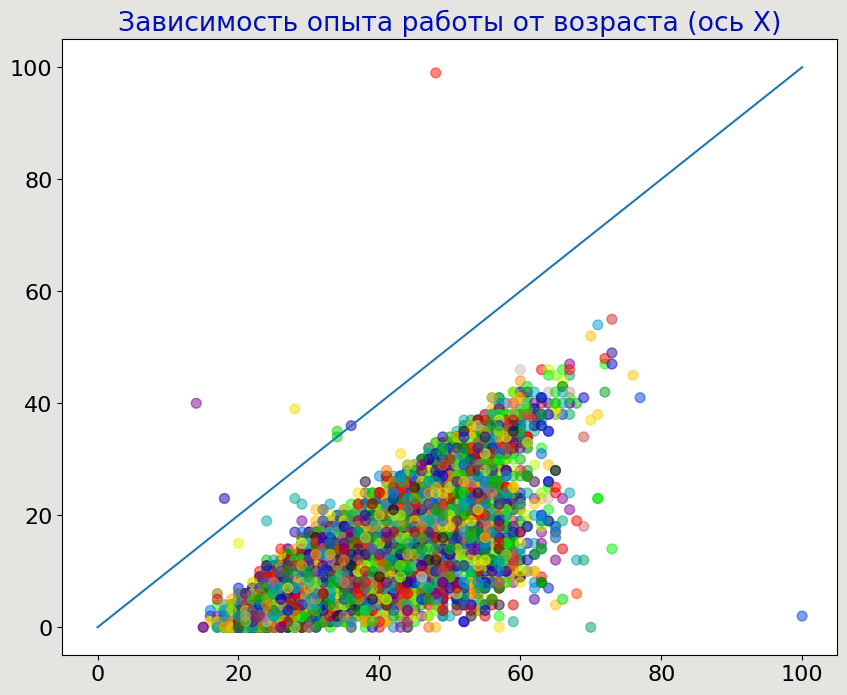

Количество выбросов: 7


In [21]:
# Преобразование месяцев в года.  
df = hh_df.copy()
df['Опыт работы (месяц)'] = (df['Опыт работы (месяц)'] / 12).round()

# Установка параметров графика.  
plt.rcParams['text.color'] = '#000FB4'
plt.rcParams['font.size'] = '16'
plt.figure(figsize=(10, 8), facecolor='#E5E4E1')
plt.title('Зависимость опыта работы от возраста (ось X)')
colors = np.random.randint(44744, size=(44744))

# Построение диаграммы рассеяния.  
fig = plt.scatter(df['Возраст'], df['Опыт работы (месяц)'], c=colors, s = 50, 
                  alpha=0.5, cmap='nipy_spectral')
fig = plt.plot([0,100], [0,100])
plt.show(fig)

# Из-за неявной диаграммы проводится фильтрация и вывод выбросов. Их 7.  
x = df[df['Возраст'] <= df['Опыт работы (месяц)']].shape[0]
print('Количество выбросов:', x)

Визуально, по диаграмме, явно видно, что над прямой расположились 4 точки. На самой линии расположились ещё три точки.  
Следовательно, получается 7 выбросов. Точно обнаружить засланных казачков-нарушителей границы помогла фильтрация.  
Выявлено 7 выбросов.  

----

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


In [22]:
before = hh_df[hh_df['ЗП (руб)'] < 1000000]
bar_data = before.groupby(by=['Пол'], as_index=False)[['ЗП (руб)']].median()

# Устанавка параметров метода update_layout для plotly.express.histogram:  
titlsE = {
    'x':0.5,
    'text':'<b>Зависимость медианной ЗП от признака "Пол"</b>',
    'font':{'size': 18, 'color':'blue','family':'Arial'}}
xaxisE_titl = {
    'text': '<b>Пол соискателя</b>',
    'font':{'size': 15, 'color':'darkred', 'family':'Arial'}}
yaxisE_titl = {
    'text': "<br></br><b>Медианная ЗП</b><br></br>",
    'font':{'size': 15, 'color':'darkred', 'family':'Arial'}}

# Построение столбчатой диаграммы.  
figE = px.bar(
    data_frame=bar_data,
    y='ЗП (руб)',
    x='Пол',
    barmode='group',
    
    color='Пол', 
    color_discrete_sequence=['#00CEC7', '#2F63FF'],
    width=450, height=500,
    ).update_layout(
        title=titlsE,
        xaxis_title=xaxisE_titl, yaxis_title=yaxisE_titl
        );
    
titls2 = {
    'x':0.5,
    'text':'<b>Распределение медианной ЗП по половому признаку</b>',
    'font':{'size': 18, 'color':'blue','family':'Arial'}}
xaxis_titl2 = {
    'text': '<b>Медианная желаемая ЗП</b>',
    'font':{'size': 15, 'color':'darkgreen', 'family':'Arial'}}
yaxis_titl2 = {
    'text': "<br></br><b>Соискатели <i>(чел.)</i>   лог. шкала</b><br></br>",
    'font':{'size': 15, 'color':'darkgreen', 'family':'Arial'}}
lgd2 = {'x':0.82, 'y': 0.72, 'font':{'size':12, 'color': 'darkred'}}
legend_titl2 = {
    'text':'            <b>Пол</b>','font':{'size':12.5, 'color': 'darkblue'}}

# Построение гистограммы и коробчатой диаграммы.  
fig2 = px.histogram(
    data_frame= before, 
    x = 'ЗП (руб)', 
    marginal='box',
    log_y=True,
    template = 'simple_white+seaborn+gridon', 
    color='Пол', height=450, width=800, 
    color_discrete_map={'М': "#2F63FF", 'Ж': "#00CEC7"}, 
    nbins=130).update_layout(
        title=titls2, 
        xaxis_title=xaxis_titl2, 
        yaxis_title=yaxis_titl2, showlegend=True, 
        legend_title=legend_titl2, 
        legend=lgd2)

fig2.data[0].name='<b>Мужской</b>'
fig2.data[2].name='<b>Женский</b>'
figE.show()
fig2.show()

<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-8.1.png?raw=true alt=\"drawing\" style=\"width:350px;\">
<center> <img src = https://github.com/Serg-NSD/SkillFactory-Data_Science/blob/main/Project-1/pict/img-8.2.png?raw=true alt=\"drawing\" style=\"width:450px;\">

### Дополнительная работа
В этой работе я решил исследовать зависимость медианной желаемой ЗП до 1000000 по признаку "Пол". Много ли работы несут на своих плечах наши хрупкие создания? Нет ли дискриминации мужчин?  
Кто для себя устанавливает большую зарплату? Почему до 1000000 рублей? Потому что выше идут уже совершенно невероятные аномальные выбросы, до 24 млн. Неплохая зарплата!  
Итак, рассмотрим первый график ─ столбчатую диаграмму с зависимостью заработной платы от пола.  
Ясно и понятно ─ у мужчин медианная зарплата 60 тыс., у женщин меньше, всего 48 тыс. В принципе, этого следовало ожидать. Да и разница не такая уж страшная. Если же отключить медиану и поставить счётчик,  
то у мужчин зарплата будет в районе 36 тыс., а у женщин ─ 8532 рубля.  
  
Второй график показывает распределение медианной ЗП по половому признаку. Включена логарифмическая шкала, но она не мешает. У мужчин длина ящика с усами больше, что неудивительно. Если отключить женский график,  
то видно, что до 400 тыс. у мужчин, по сравнению с женщинами, очень высоки требования к зарплате. В обоих категориях наблюдаются сильные всплески количества соискателей при общем спаде. Вероятно, может срабатывает  
эффект коллективизма ─ ведь мы не задумываясь многое повторяем, ─ а возможно, ещё какие-то причины. В совокупности многое наберётся. У женщин есть один (но зато какой!) потенциальный выброс (в диапазоне меньше 1000000 руб).  
Если это не мусор, то есть заявка на зарплату в 923983 руб. Даже у мужчин такого нет. Зато они отличились потенциальными выбросами (в этом же диапазоне) начиная с 420 тыс. и выше. Если у женщин на 400 тыс. всё заканчивается  
(кроме 900 тыс. выброса), то мужики всё никак не успокоятся и бурлят почти до самого конца шкалы. Выбросы, причём не одиночными соискателями, а целыми группами. В результате имеется длиный ус вправо, плавно переходящий в  
выбросы. Его верхняя граница стоит на 190 тыс. Сейчас такой зарплатой никого не удивишь. Вот выше значения в 200-250 тыс. по боксу - это выбросы, в жизни же - это вполне определённые зарплаты, не фантастические.  
Медиана у женщин стоит на отметке в 48 тыс., у мужчин стоит на 60. Вроде недалеко. Но 3-я квартиль у мужчин 100, у женщин 70. Т.е. разница увеличилась более, чем в два раза. Основное количество соискателей у женщин ищут работу  
с зарплатой от 30 до 70 тыс. рублей, а у мужчин от 40 до 100000 тыс. рублей. Медиана у мужчин находится на 60 тыс. Она сдвинута влево и это несмотря на большие выбросы за верхней границей. Это объясняется тем, что большее количество  
соискателей расположено в нижних границах желаемой зарплаты, 30-60 тыс. рублей. Если принять во внимание признак пола, то явно нет никакой дискриминации, вполне объективный график.  

-------

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [23]:
df = hh_df.copy()

dupl_columns = list(df.columns)
mask = df.duplicated(subset=dupl_columns)
df_duplicates = df[mask]
print(f'Количество полных дубликатов в таблице: {df_duplicates.shape[0]}')
df = df.drop_duplicates(subset=dupl_columns)
hh_clear = df.sort_index(ascending=True).reset_index(drop = True)

Количество полных дубликатов в таблице: 161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [24]:
all_skip = hh_clear.isnull().sum().sum()
print("Всего пропусков:", all_skip)
skip_in_cols = hh_clear.isnull().sum()
print(f"\n{skip_in_cols.to_string()}")

Всего пропусков: 171

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
стажировка                           0
волонтерство                         0
гибкий график                        0
сменный график                       0
полный день                          0
вахтовый метод                       0
удаленная работа                     0
ЗП (руб)                             0


3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [25]:
# Удаление строк с пропусками
hh_clear.dropna(
    subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'], 
    inplace=True)
hh_clear=hh_clear.sort_index(ascending=True).reset_index(drop = True)

# Заполнение пропусков медианными значениями
values = {
    'Опыт работы (месяц)': hh_clear['Опыт работы (месяц)'].median(),
     }
hh_clear = hh_clear.fillna(values)
coun_null = hh_clear.isnull().sum()

# Вывод ответа 
result = hh_clear['Опыт работы (месяц)'].mean().round()
print(f'Результрующее среднее значение признака "Опыт работы (месяц)" \
после заполнения пропусков: {int(result)}.')

Результрующее среднее значение признака "Опыт работы (месяц)" после заполнения пропусков: 114.


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [26]:
# Выявление выбросов и присвоение значений переменным.  
x = hh_clear[hh_clear['ЗП (руб)']>1000000].shape[0]
y = hh_clear[hh_clear['ЗП (руб)']<1000].shape[0]
print('Количество выбросов при зарплате < 1000 руб. и зарплате > 1000000 руб. составляет:', x+y)

# Удалние выбросов, реиндексация.  
hh_clear=hh_clear.loc[hh_clear['ЗП (руб)']<=1000000]
hh_clear=hh_clear.loc[hh_clear['ЗП (руб)']>=1000]
hh_clear=hh_clear.sort_index(ascending=True).reset_index(drop = True)

# Проверка на остатки от выбросов.  
x = hh_clear[hh_clear['ЗП (руб)']>1000000].shape[0]
y = hh_clear[hh_clear['ЗП (руб)']<1000].shape[0]
print('После очистки количество выбросов составялет:', x+y)

Количество выбросов при зарплате < 1000 руб. и зарплате > 1000000 руб. составляет: 89
После очистки количество выбросов составялет: 0


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [27]:
# Форматирование месяцев в года в признаке опыта работы.  
hh_clear['Опыт работы (месяц)'] = round(hh_clear['Опыт работы (месяц)']/12, 4)

x = hh_clear[hh_clear['Опыт работы (месяц)'] > hh_clear['Возраст']].shape[0]
print('Количество резюме, в которых опыт работы в годах превышает возраст соискателя:', x)

# Удаление выбросов в признаке опыта работы, реиндексация.  
hh_clear=hh_clear.loc[hh_clear['Опыт работы (месяц)']<=hh_clear['Возраст']]
hh_clear=hh_clear.sort_index(ascending=True).reset_index(drop = True)

# Вывод информации.  
y = hh_clear[hh_clear['Опыт работы (месяц)'] > hh_clear['Возраст']].shape[0]
print('После очистки количество выбросов составялет:', y)

Количество резюме, в которых опыт работы в годах превышает возраст соискателя: 7
После очистки количество выбросов составялет: 0


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

Количество выбросов:  3


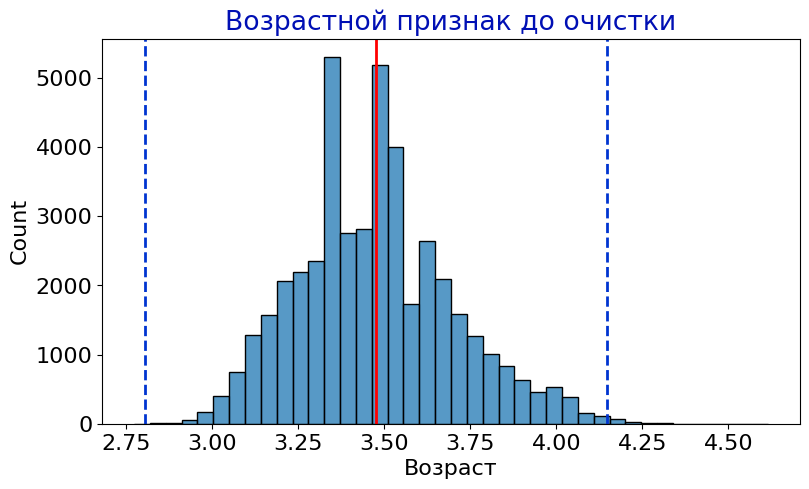

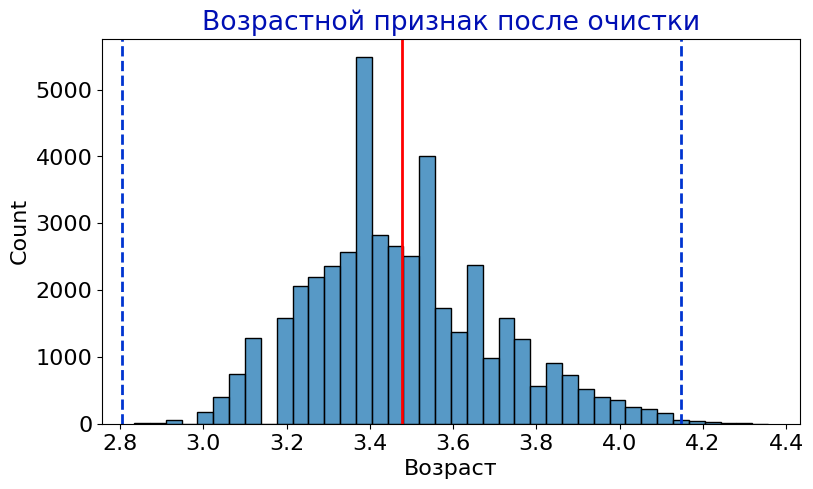

In [28]:
# Построение гистограммы с данными до очистки.  
fig, ax = plt.subplots(figsize=(9,5))
log_age = np.log(hh_clear['Возраст']+1)
histplot = sns.histplot(
    log_age,
    bins=40, 
    ax=ax)
histplot.axvline(log_age.mean(), color='red', lw=2)
histplot.axvline(log_age.mean()+3*log_age.std(), color='#0034D0', ls='--', lw=2)
histplot.axvline(log_age.mean()-3*log_age.std(), color='#0034D0', ls='--', lw=2)
histplot.set_title('Возрастной признак до очистки')

# Функция метода z-отклонения ..
def outliers_z_score_mod(data, feature, left=3, right=3, log_scale=False):
    if log_scale:
        x = np.log(data[feature]+1)
    else:
        x = data[feature]
    mu = x.mean()
    sigma = x.std()
    lower_bound = mu - left * sigma
    upper_bound = mu + right * sigma
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    return outliers, cleaned

# Вызов функции, вывод информации.  
outliers, cleaned = outliers_z_score_mod(hh_clear, 'Возраст', 3, 4, True)
print('Количество выбросов: ', outliers.shape[0])
w=list(outliers['Возраст'].unique())

# Удаление выбросов.  
for i in range(0, len(w)):
    hh_clear=hh_clear.loc[hh_clear['Возраст'] != w[i]]

# Построение гистограммы с данными после очистки.  
fig, ax = plt.subplots(figsize=(9, 5))
log_age = np.log(hh_clear['Возраст']+1)
histplot = sns.histplot(
    log_age, bins=40, ax=ax)
histplot.set_title('Возрастной признак после очистки')
histplot.axvline(log_age.mean(), color='red', lw=2)
histplot.axvline(log_age.mean()+3*log_age.std(), color='#0034D0', ls='--', lw=2)
histplot.axvline(log_age.mean()-3*log_age.std(), color='#0034D0', ls='--', lw=2);

Графический интервал метода трёх сигм показывает, что что количество наблюдений, не входящие в интервал, достаточно невелико. Мы удалили выбросы в возрасте соискателя (7 шт.) видно, что интервал сузился и среднее значение стало ближе к медианному. Правосторонняя ассиметрия сохранилась, почти не изменилась. Из-за небольшого количества выбросов график изменился незначительно. Из этого делаем вывод: надо внимательней приглядеться к опыту работы и возрасту. Были удалён только опыт со значением, превышающим возраст. Но вот такая получается вешь. Возраст, например, 20 лет. Опыт работы ─ 19 лет. Согласно нашему фильтру этот опыт был оставлен в датасете. Ага, человек работает с одного года. Возраст, по этой диаграмме вполне ревалентный.